# Retrieve simulated HSI imagery through Sentinel Hub

The simulated tiles from PRISMA imagery have been ingested as [BYOC](https://docs.sentinel-hub.com/api/latest/api/byoc/) into Sentinel Hub, allowing you therefore to access and visualise the images through the service API and tools like [EOBrowser](https://apps.sentinel-hub.com/eo-browser). 

This notebook will show you have to retrieve data from the collection and how to visualise it in EOBrowser.

In [1]:
import geopandas as gpd
from sentinelhub import SHConfig, wgs84_to_utm, get_utm_crs, BBox, DataCollection
from eolearn.io import SentinelHubEvalscriptTask
from eolearn.core import FeatureType
from datetime import datetime, timedelta
from matplotlib import pyplot as plt

In order to download the training data through the provided APIs you would need to set-up an account for [Sentinel Hub](https://www.sentinel-hub.com/). 

If you don't have one already, create a [free trial account](https://apps.sentinel-hub.com/dashboard/), register an OAuth client from your dashboard by clicking on the "Create a new OAuth client" button, set the "Client grant type" to "Client Credentials" and save the secret value. Paste below the `client_id` and `secret_client_id` and you are ready to go. For more information on configuration of SH, please visit [this link](https://sentinelhub-py.readthedocs.io/en/latest/configure.html).

If you need to extend your trial account or have any issue using the service, please [contact support](info@sentinel-hub.com).

**If you are using the Euro Data Cube (EDC) resources**

The accounts have been already created and configured for you, and what you need is only to retrieve the SentinelHub credentials from your dashboard and paste them below (from your EDC dashboard click on EDC Sentinel Hub in the My API service subscriptions, then click on SHOW credential in API Access section).

In [2]:
config = SHConfig()

CLIENT_ID = ""  # your Sentinel Hub OAuth client ID
CLIENT_SECRET = ""  # your Sentinel Hub OAuth client secret

if CLIENT_ID and CLIENT_SECRET:
    config.sh_client_id = CLIENT_ID
    config.sh_client_secret = CLIENT_SECRET

if config.sh_client_id == "" or config.sh_client_secret == "":
    print(
        "Warning! To use Sentinel Hub services, please provide the credentials (client ID and client secret)."
    )

In [3]:
# This is the ID of the collection containing the prisma tiles.
BYOC_COLLECTION_ID = "a44efc4d-0de7-4a16-a69b-1e30234f31cc"

# Load prisma location GeoPackage

Load the locations containing the prisma data 

In [4]:
hsi_prisma_locations = gpd.read_file("hsi-prisma-locations.gpkg")

In [5]:
WORLD_GDF = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

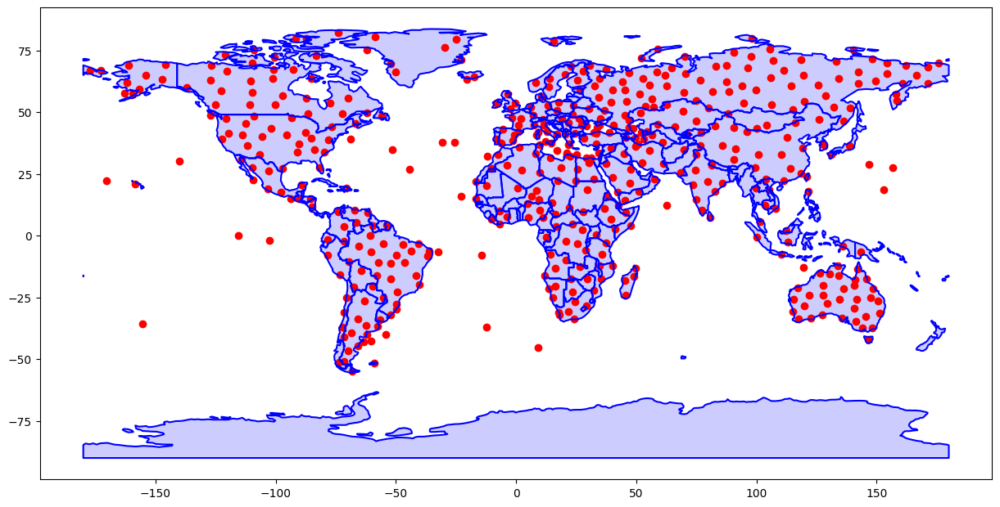

In [6]:
fig, ax = plt.subplots(figsize=(15, 10))
WORLD_GDF.plot(ax=ax, color="b", alpha=0.2)
WORLD_GDF.boundary.plot(ax=ax, color="b")
hsi_prisma_locations.plot(ax=ax, color="r");

# Retrieve sample tile

In [7]:
def get_utm_bbox(lat_centre: float, lon_centre: float, BBOX_SIZE: int = 45000):
    """Returns a bounding box of size 45 km x 45 km given the centroid of the area-of-interest in WGS84"""

    east, north = wgs84_to_utm(lon_centre, lat_centre)

    east, north = 10 * int(east / 10), 10 * int(north / 10)
    crs = get_utm_crs(lon_centre, lat_centre)

    return BBox(
        bbox=(
            (east - BBOX_SIZE // 2, north - BBOX_SIZE // 2),
            (east + BBOX_SIZE // 2, north + BBOX_SIZE // 2),
        ),
        crs=crs,
    )

In [8]:
sample_tile = hsi_prisma_locations.sample(1)

In [12]:
sample_tile

,cloud_cover,filename,date,order_id,geometry
176,8.31231,PRS_L1_STD_OFFL_20210501070552_20210501070556_...,01/05/2021,38795,POINT (98.17800 79.79590)


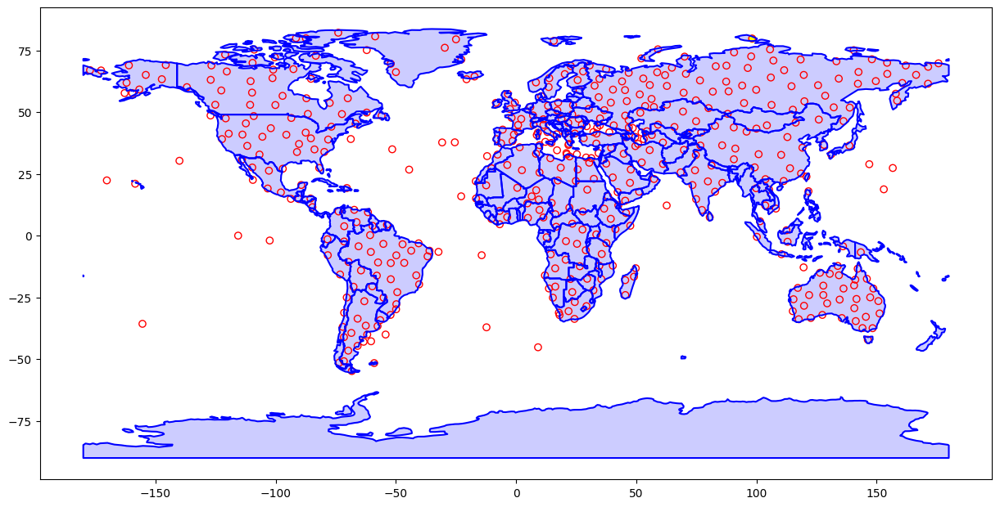

In [26]:
fig, ax = plt.subplots(figsize=(15, 10))
WORLD_GDF.plot(ax=ax, color="b", alpha=0.2)
WORLD_GDF.boundary.plot(ax=ax, color="b")
sample_tile.plot(ax=ax, color="yellow")
hsi_prisma_locations.plot(ax=ax, color="r", facecolor="none");

In [27]:
tile_date = datetime.strptime(sample_tile.date.iloc[0], "%d/%m/%Y")
time_interval = (tile_date, tile_date + timedelta(days=1))

In [28]:
time_interval

(datetime.datetime(2021, 5, 1, 0, 0), datetime.datetime(2021, 5, 2, 0, 0))

Transform center of tile to bounding box


In [29]:
bbox = get_utm_bbox(sample_tile.geometry.iloc[0].y, sample_tile.geometry.iloc[0].x)

Define evalscript which downloads all of the tiles 

In [30]:
evalscript = """
    //VERSION=3

    function setup() {
        return {
            input: ['BAND_450', 'BAND_460', 'BAND_470', 'BAND_480', 'BAND_490', 
            'BAND_500', 'BAND_510', 'BAND_520', 'BAND_530', 'BAND_540', 
            'BAND_550', 'BAND_560', 'BAND_570', 'BAND_580', 'BAND_590', 
            'BAND_600', 'BAND_610', 'BAND_620', 'BAND_630', 'BAND_640', 
            'BAND_650', 'BAND_660', 'BAND_670', 'BAND_680', 'BAND_690', 
            'BAND_700', 'BAND_710', 'BAND_720', 'BAND_730', 'BAND_740', 
            'BAND_750', 'BAND_760', 'BAND_770', 'BAND_780', 'BAND_790', 
            'BAND_800', 'BAND_810', 'BAND_820', 'BAND_830', 'BAND_840', 
            'BAND_850', 'BAND_860', 'BAND_870', 'BAND_880', 'BAND_890', 
            'BAND_900', 'BAND_910', 'BAND_920', 'BAND_930', 'BAND_940',
            "dataMask"], 
            output:[{
                id: "bands",
                bands: 50,
                sampleType: SampleType.FLOAT32
            }, 
            {
                id: "dataMask",
                bands: 1,
                sampleType: SampleType.UINT8
            }
            ]
        }
    }

    function evaluatePixel(sample) {
        return {
           bands: [sample.BAND_450,sample.BAND_460,sample.BAND_470,sample.BAND_480,
                   sample.BAND_490,sample.BAND_500,sample.BAND_510,sample.BAND_520,
                   sample.BAND_530,sample.BAND_540,sample.BAND_550,sample.BAND_560,
                   sample.BAND_570,sample.BAND_580,sample.BAND_590,sample.BAND_600,
                   sample.BAND_610,sample.BAND_620,sample.BAND_630,sample.BAND_640,
                   sample.BAND_650,sample.BAND_660,sample.BAND_670,sample.BAND_680,
                   sample.BAND_690,sample.BAND_700,sample.BAND_710,sample.BAND_720,
                   sample.BAND_730,sample.BAND_740,sample.BAND_750,sample.BAND_760,
                   sample.BAND_770,sample.BAND_780,sample.BAND_790,sample.BAND_800,
                   sample.BAND_810,sample.BAND_820,sample.BAND_830,sample.BAND_840,
                   sample.BAND_850,sample.BAND_860,sample.BAND_870,sample.BAND_880,
                   sample.BAND_890,sample.BAND_900,sample.BAND_910,sample.BAND_920,
                   sample.BAND_930,sample.BAND_940],
           dataMask: [sample.dataMask]
        };
    }
"""

# Download the data for the sample tile

In [31]:
download_data = SentinelHubEvalscriptTask(
    features=[(FeatureType.DATA, "bands"), (FeatureType.MASK, "dataMask")],
    evalscript=evalscript,
    data_collection=DataCollection.define_byoc(BYOC_COLLECTION_ID),
    resolution=45,
    config=config,
    max_threads=3,
)

In [32]:
eop = download_data.execute(bbox=bbox, time_interval=time_interval)

In [33]:
eop

EOPatch(
  data={
    bands: numpy.ndarray(shape=(1, 1000, 1000, 50), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1000, 1000, 1), dtype=uint8)
  }
  meta_info={
    size_x: 1000
    size_y: 1000
    time_difference: 1.0
    time_interval: ('2021-05-01T00:00:00', '2021-05-02T00:00:00')
  }
  bbox=BBox(((461240.0, 8836420.0), (506240.0, 8881420.0)), crs=CRS('32647'))
  timestamp=[datetime.datetime(2021, 5, 1, 7, 5, 52)]
)

# Plot tiles

## Full extent

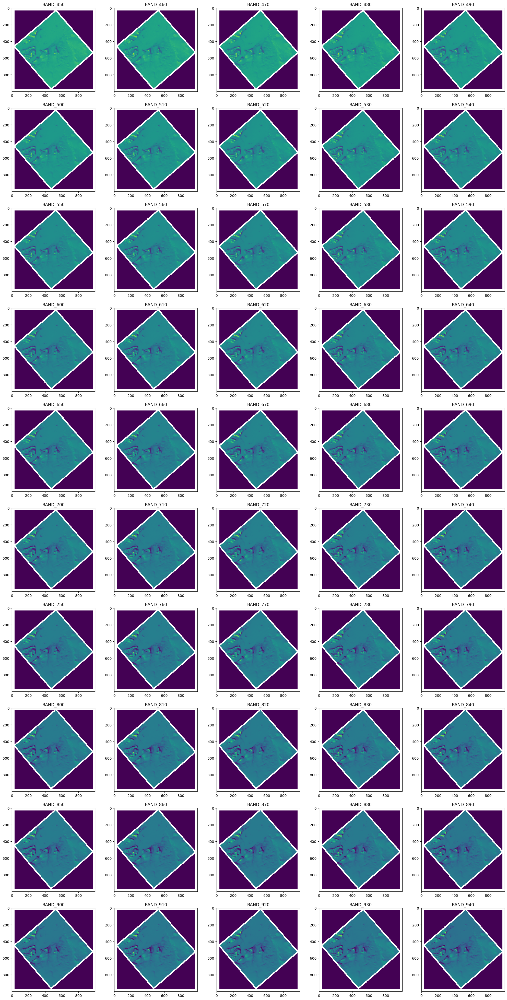

In [34]:
fig, axs = plt.subplots(nrows=10, ncols=5, figsize=(5 * 5, 5 * 10))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(eop.data["bands"][..., i].squeeze())
    ax.set_title(f"BAND_{450+i*10}")

## Zoomed in

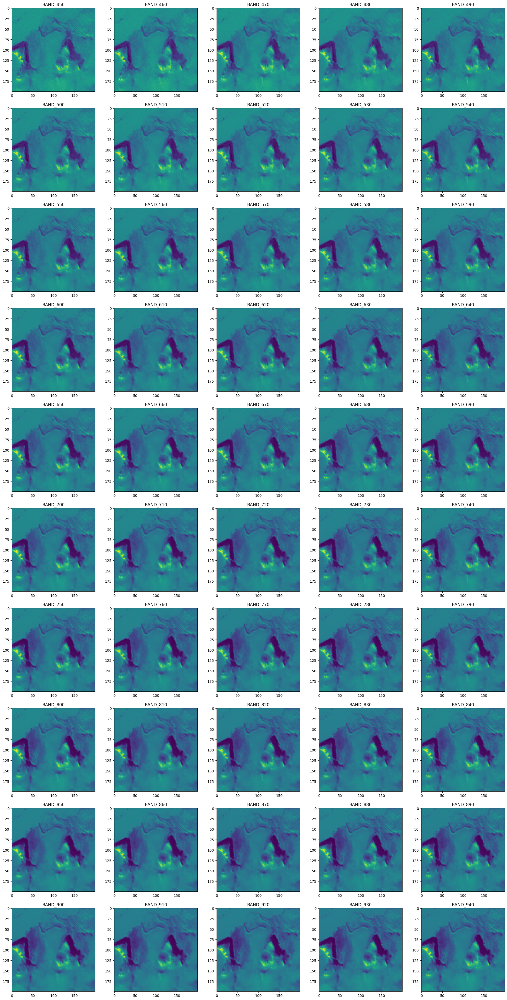

In [35]:
fig, axs = plt.subplots(nrows=10, ncols=5, figsize=(5 * 5, 5 * 10))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(eop.data["bands"][0, 400:600, 400:600, i].squeeze())
    ax.set_title(f"BAND_{450+i*10}")

# Visualize collection on EOBrowser

You can treat the simulated HSI collection as any other collection available on Sentinel Hub, and you can therefore easily visualise and explore it. Check-out the [documentation](https://www.sentinel-hub.com/explore/eobrowser/) for more information about EOBrowser. 

To visualise the HSI imagery in EOBrowser do the following:

 * login to your dashboard and create a visualization layer for the collection
    * login to [dashboard](https://apps.sentinel-hub.com/dashboard/)
    * go to `Configuration utility`;
    * create configuration or choose an existing one;
    * select `New layer` and assign a name, e.g. `HSI`;
    * select `Bring Your Own COG` from Source, and `BYOC` from `Collection Type`;
    * insert the collection ID provided above;
    * add an evalscript as the above in the `Data processing`, returning a combination of 3 bands. To reduce load to the service and make the response faster, avoid loading all 50 bands if not necessary;
    * login to EOBrowser, select the `Based on: HSI` from the theme and go to the desired location at the desired time interval to visualise the bands.

![eobrowser](figs/eo-browser-example.png)